In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import geopandas as gpd
import geojson
import json
import folium


In [2]:
def remove_dollar_sign(value):
    if pd.isna(value):
        return np.NaN
    else:
        return float(value.replace("$", "").replace(",", "").replace(" ", ""))


def no_values(val):
    if pd.isna(val):
        return np.NaN


In [3]:
df = pd.read_csv('/home/julia/Documents/TUE/Year 2/Quartile 2/Visualizations/Data Sets/Airbnb/airbnb_open_data.csv', low_memory=False)

In [4]:
df.columns = [col.lower().replace(" ", "_") for col in df.columns]

print(df.columns)

Index(['id', 'name', 'host_id', 'host_identity_verified', 'host_name',
       'neighbourhood_group', 'neighbourhood', 'lat', 'long', 'country',
       'country_code', 'instant_bookable', 'cancellation_policy', 'room_type',
       'construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365', 'house_rules', 'license'],
      dtype='object')


In [5]:
len(df)

102599

In [6]:
def rem_outliers(col):
    q25 = df[col].quantile(q=0.25)
    q75 = df[col].quantile(q=0.75)
    intr_qr = q75-q25
    maxi = q75+(1.5*intr_qr)
    mini = q75-(1.5*intr_qr)
    if col == "minimum_nights":
        mini = 1
    elif col == "availability_365":
        mini = 0
        maxi = 365
    elif col == "lat":
        return
    elif col == "long":
        return
    elif col == "id":
        return
    df.drop(df.loc[df[col] > maxi].index, inplace=True)
    df.drop(df.loc[df[col] < mini].index, inplace=True)
    return

In [7]:
df['neighbourhood_group'] = df['neighbourhood_group'].replace(['brookln'], 'Brooklyn')
df['neighbourhood_group'] = df['neighbourhood_group'].replace(['manhatan'], 'Manhattan')
df = df[df["neighbourhood_group"].notna()]

In [8]:
df["price"] = df["price"].apply(lambda x: remove_dollar_sign(x))
df["service_fee"] = df["service_fee"].apply(lambda x: remove_dollar_sign(x))


In [21]:

# Using DataFrame.filter() method.
brooklyn = df[df["neighbourhood_group"]=="Brooklyn"].filter(['price','neighbourhood','room_type'], axis=1)
brooklyn

,price,neighbourhood,room_type
21,477.0,Williamsburg,Entire home/apt
26,530.0,Windsor Terrace,Private room
35,191.0,Bedford-Stuyvesant,Private room
39,1020.0,Flatbush,Private room
42,370.0,South Slope,Entire home/apt
...,...,...,...
102587,388.0,Williamsburg,Entire home/apt
102589,306.0,Flatbush,Private room
102590,250.0,Crown Heights,Entire home/apt
102594,844.0,Williamsburg,Private room


In [10]:
rem_outliers("minimum_nights")
rem_outliers("price")
rem_outliers("number_of_reviews")
rem_outliers("review_rate_number")
rem_outliers("calculated_host_listings_count")
rem_outliers("reviews_per_month")
rem_outliers("availability_365")

In [11]:
df.drop_duplicates(subset=['lat','long'])

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,country,...,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,license
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,124.0,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
11,1007411,Beautiful 1br on Upper West Side,18824631834,verified,Alan,Manhattan,Upper West Side,40.80316,-73.96545,United States,...,121.0,5.0,53.0,6/22/2019,0.43,4.0,1.0,163.0,"My ideal guests would be warm, friendly, and r...",NaN
20,1012382,Huge 2 BR Upper East Cental Park,79805143117,verified,Audrey,Manhattan,East Harlem,40.79685,-73.94872,United States,...,56.0,7.0,0.0,NaN,NaN,3.0,2.0,347.0,"No smoking, No pets. No shoes in the house. V...",NaN
21,1012934,Sweet and Spacious Brooklyn Loft,86554611512,verified,Alissa,Brooklyn,Williamsburg,40.71842,-73.95718,United States,...,95.0,3.0,9.0,12/28/2021,0.07,3.0,1.0,193.0,- No smoking or open flames on the property - ...,NaN
26,1015696,Sunny Bedroom Across Prospect Park,81686279636,NaN,Carlos,Brooklyn,Windsor Terrace,40.65599,-73.97519,United States,...,106.0,1.0,19.0,6/23/2019,1.37,5.0,2.0,344.0,"Quiet neighborhood, middle apartment of big ho...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74976,42410581,Private room in a perfect location in the city,89604169567,verified,Shai,Manhattan,Upper East Side,40.76174,-73.96625,United States,...,72.0,3.0,1.0,3/12/2019,0.25,3.0,1.0,8.0,NaN,NaN
75005,42426598,Bedroom in Prime Bushwick,91089672677,unconfirmed,Elena,Brooklyn,Bushwick,40.70235,-73.92892,United States,...,91.0,3.0,1.0,6/5/2019,0.88,4.0,1.0,0.0,NaN,NaN
75014,42431568,Modern & Cozy 2 BR Private Apartment in Brooklyn,88128853963,unconfirmed,Gk,Brooklyn,Bay Ridge,40.63189,-74.02322,United States,...,169.0,1.0,14.0,6/14/2019,3.59,3.0,1.0,271.0,NaN,NaN
75145,42503920,Newly Renovated Garden Apartment,54312225272,verified,Margie,Brooklyn,Bedford-Stuyvesant,40.68470,-73.94350,United States,...,17.0,2.0,3.0,4/23/2019,1.06,2.0,1.0,157.0,NaN,NaN


In [12]:
px.density_mapbox(df, "lat", "long", z="price", mapbox_style="stamen-terrain")

<AxesSubplot:xlabel='long', ylabel='lat'>

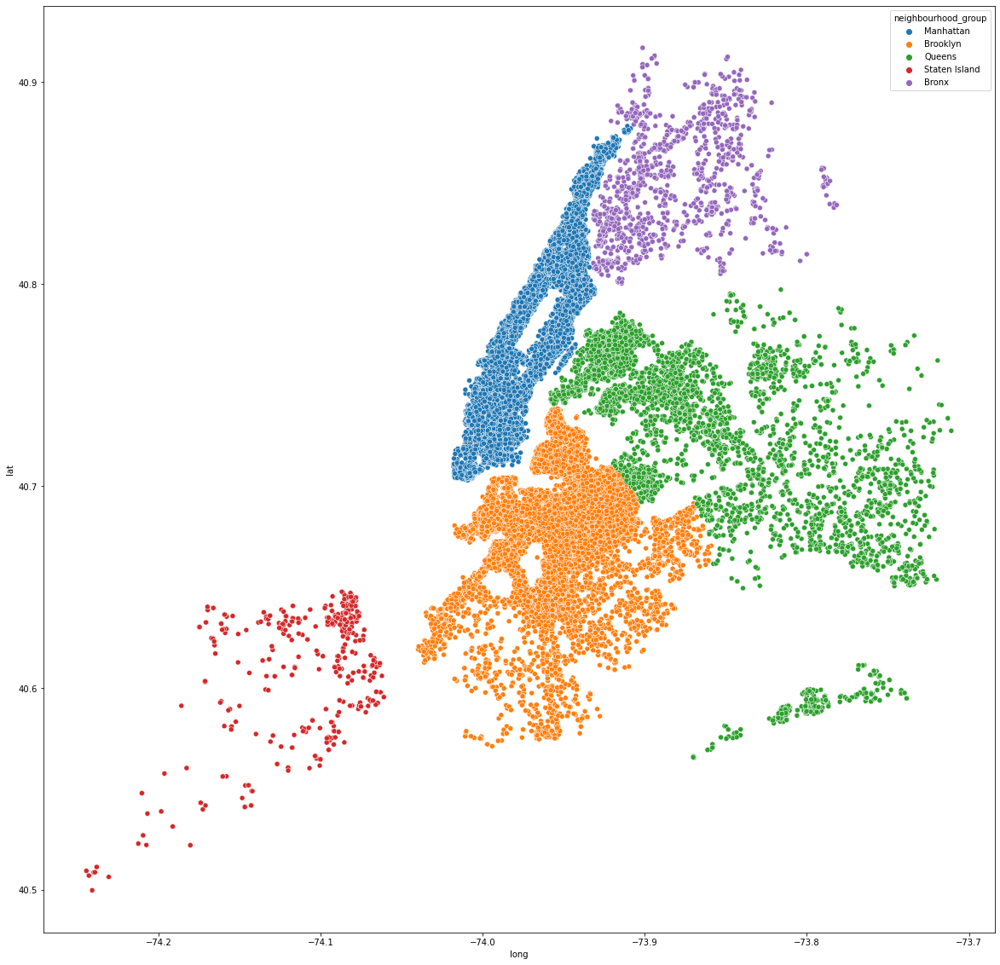

In [13]:
plt.figure(figsize=(20,20))
sns.scatterplot(x='long', y='lat', hue='neighbourhood_group', data=df)

In [14]:
fig = px.scatter_mapbox(df, lat="lat", lon="long", color="price",
                  color_continuous_scale=px.colors.sequential.tempo, mapbox_style="stamen-terrain", zoom = 10)

fig.show()

In [15]:
trial = df.filter(['price','lat', 'long', 'id'], axis=1)

In [16]:
hell = '/home/julia/Documents/TUE/Year 2/Quartile 2/Visualizations/Data Sets/Airbnb/Borough Boundaries.geojson'

geojson = ('/home/julia/Documents/TUE/Year 2/Quartile 2/Visualizations/Data Sets/Airbnb/boro.geojson')

In [17]:
import fiona
from shapely.geometry import shape,mapping, Point, Polygon, MultiPolygon
multipol = fiona.open(hell)
multi = multipol.next() # only one feature in the shapefile
multi

/tmp/ipykernel_54053/645139264.py:4: FionaDeprecationWarning:

Collection.__next__() is buggy and will be removed in Fiona 2.0. Switch to `next(iter(collection))`.



{'type': 'Feature',
 'id': '0',
 'properties': OrderedDict([('boro_code', '5'),
              ('boro_name', 'Staten Island'),
              ('shape_area', '1623620725.06'),
              ('shape_leng', '325917.353702')]),
 'geometry': {'type': 'MultiPolygon',
  'coordinates': [[[(-74.05050806403247, 40.56642203416086),
     (-74.05047137128506, 40.566417387435564),
     (-74.05030321271722, 40.566417461200594),
     (-74.05012587375454, 40.56640588033513),
     (-74.04998352562573, 40.566395924928315),
     (-74.04931640362085, 40.56588774778048),
     (-74.04923629842045, 40.565362736368144),
     (-74.05002620158642, 40.565318180621176),
     (-74.05074409977213, 40.56588712593507),
     (-74.05074768943298, 40.56595407675391),
     (-74.05073223954238, 40.565992119017764),
     (-74.05073571037052, 40.566032774595826),
     (-74.05080326895582, 40.566052200461186),
     (-74.05087333045633, 40.566081240209904),
     (-74.05090601705051, 40.56609434162805),
     (-74.05091292518976, 

In [18]:
import shapefile
pts = shapefile.Reader("points.shp")
polys = shapefile.Reader("multipol.shp")
points = [pt.shape.__geo_interface__ for pt in pts.shapeRecords()]
multi = shape(polys.shapeRecords()[0].shape.__geo_interface__) # 1 polygon
print multi
MULTIPOLYGON (((-0.5275288092189501 0.5569782330345711, -0.117797695262484 0.2906530089628682, -0.2560819462227913 0.01920614596670933, -0.7093469910371319 -0.08834827144686286, -0.8629961587708066 0.1830985915492958, -0.734955185659411 0.3982074263764405, -0.5275288092189501 0.5569782330345711)), ((0.1997439180537772 0.06017925736235596, 0.5480153649167734 0.1293213828425096, 0.729833546734955 0.03969270166453265, 0.8143405889884763 -0.1395646606914211, 0.701664532650448 -0.3854033290653009, 0.4763124199743918 -0.5006402048655569, 0.2688860435339309 -0.4238156209987196, 0.1895006402048656 -0.2291933418693981, 0.1997439180537772 0.06017925736235596)), ((-0.3764404609475033 -0.295774647887324, -0.1152368758002562 -0.3597951344430217, -0.03329065300896294 -0.5800256081946222, -0.1152368758002562 -0.7413572343149808, -0.3072983354673495 -0.8591549295774648, -0.58898847631242 -0.6927016645326505, -0.6555697823303457 -0.4750320102432779, -0.3764404609475033 -0.295774647887324)))
for i, pt in enumerate(points):
    point = shape(pt)
    if point.within(multi): 
        print i, shape(points[i])

SyntaxError: Missing parentheses in call to 'print'. Did you mean print(multi)? (2522452705.py, line 6)

In [ ]:
df["neighbourhood_group"].unique()

In [ ]:
m = folium.Map(location=[40.7128, -74.0060],tiles='openstreetmap')
m

In [ ]:

folium.Choropleth(
    geo_data=geojson,
    name="choropleth",
    data=dick,
    columns=["neighbourhood_group", "price"],
    fill_color="YlOrRd",
    fill_opacity=0.7,
    key_on = 'feature.properties.cartodb_id', 
    line_opacity=0.2,
    legend_name="Price",
).add_to(m)

folium.LayerControl().add_to(m)

m


In [ ]:
mean_boro = df.groupby(["neighbourhood_group"])["price"].agg("mean")

mean_boro

In [ ]:
mean_neigh = df.groupby(["neighbourhood"])["price"].agg("mean")

mean_neigh

In [ ]:
with open(geojson) as f:
  data = f.read()

In [ ]:
fig = px.choropleth_mapbox(df, geojson=geojson, color='price', 
                           center={"lat":40.7128, "lon":-74.0060},color_continuous_scale='Viridis', 
                           locations='neighbourhood_group',
                           mapbox_style="carto-positron")
fig.show()

#check Folium.Choropleth?

In [28]:
px.imshow(brooklyn, x = 'neighbourhood', y='room_type', color='price')

TypeError: imshow() got an unexpected keyword argument 'color'

In [31]:
brooklyn = df[df["neighbourhood_group"]=="Brooklyn"].filter(['lat','long','number_of_reviews', 'review_rate_number','neighbourhood'], axis=1)


In [ ]:
px.box(brooklyn, "number_of_reviews")

In [33]:
neigh = list(brooklyn["neighbourhood"].unique())


['Williamsburg',
 'Windsor Terrace',
 'Bedford-Stuyvesant',
 'Flatbush',
 'South Slope',
 'Prospect-Lefferts Gardens',
 'Clinton Hill',
 'Park Slope',
 'Brooklyn Heights',
 'Prospect Heights',
 'Flatlands',
 'Greenpoint',
 'Cobble Hill',
 'Fort Greene',
 'Kensington',
 'Crown Heights',
 'Carroll Gardens',
 'Gowanus',
 'Bushwick',
 'Boerum Hill',
 'Gravesend',
 nan,
 'Brighton Beach',
 'Cypress Hills',
 'Bay Ridge',
 'Vinegar Hill',
 'East New York',
 'Sunset Park',
 'Columbia St',
 'Canarsie',
 'Borough Park',
 'Downtown Brooklyn',
 'Midwood',
 'Bensonhurst',
 'Fort Hamilton',
 'Sheepshead Bay',
 'Red Hook',
 'East Flatbush',
 'DUMBO',
 'Sea Gate',
 'Brownsville',
 'Navy Yard',
 'Manhattan Beach',
 'Dyker Heights',
 'Bergen Beach',
 'Coney Island',
 'Bath Beach',
 'Mill Basin',
 'Gerritsen Beach']

In [56]:
def sat_score(neighbor):
    data = brooklyn[brooklyn['neighbourhood']==neighbor].copy()
    sum_all = data['review_rate_number'].sum()
    n = data['review_rate_number'].count()
    sat = sum_all/(5*n)
    return sat

In [57]:
scores = []

for x in neigh:
    scores.append(sat_score(x))

scores

/tmp/ipykernel_54053/4204144899.py:5: RuntimeWarning:

invalid value encountered in double_scalars



[0.6493392070484582,
 0.597,
 0.6530224525043178,
 0.6512055109070034,
 0.6158469945355192,
 0.6479108635097494,
 0.638950276243094,
 0.6434782608695652,
 0.6342342342342342,
 0.6345291479820628,
 0.6291390728476821,
 0.6437182280319536,
 0.6372093023255814,
 0.6432786885245901,
 0.685,
 0.6563079777365491,
 0.649090909090909,
 0.6191780821917808,
 0.6487319422150882,
 0.6539823008849558,
 0.6613636363636364,
 nan,
 0.6951456310679611,
 0.6686274509803921,
 0.6353658536585366,
 0.6311111111111111,
 0.6691275167785234,
 0.6376699029126214,
 0.6877192982456141,
 0.6801762114537445,
 0.6494845360824743,
 0.6881889763779527,
 0.7023255813953488,
 0.6229885057471264,
 0.7270588235294118,
 0.6358744394618834,
 0.6141732283464567,
 0.6532710280373831,
 0.5885714285714285,
 0.5777777777777777,
 0.6772277227722773,
 0.7217391304347827,
 0.5333333333333333,
 0.6666666666666666,
 0.552,
 0.5333333333333333,
 0.6378378378378379,
 0.7846153846153846,
 0.6]

In [50]:
data = brooklyn[brooklyn['neighbourhood']=='Mill Basin'].copy()
data

,lat,long,number_of_reviews,review_rate_number,neighbourhood
26236,40.60903,-73.91846,5.0,5.0,Mill Basin
28283,40.61224,-73.91854,25.0,4.0,Mill Basin
34228,40.61768,-73.91669,36.0,5.0,Mill Basin
45836,40.61058,-73.90971,3.0,4.0,Mill Basin
51633,40.61264,-73.91791,5.0,2.0,Mill Basin
52769,40.61784,-73.91076,38.0,3.0,Mill Basin
54772,40.60997,-73.92248,7.0,3.0,Mill Basin
59558,40.61013,-73.91234,9.0,3.0,Mill Basin
64831,40.61367,-73.91809,20.0,4.0,Mill Basin
66711,40.60905,-73.91883,3.0,3.0,Mill Basin


In [54]:
n = data['review_rate_number'].count()
county

13

In [62]:
heat = {'neighbourhood': neigh, 'sat_score': scores}

heat = pd.DataFrame(heat)
heat

,neighbourhood,sat_score
0,Williamsburg,0.649339
1,Windsor Terrace,0.597000
2,Bedford-Stuyvesant,0.653022
3,Flatbush,0.651206
4,South Slope,0.615847
5,Prospect-Lefferts Gardens,0.647911
6,Clinton Hill,0.638950
7,Park Slope,0.643478
8,Brooklyn Heights,0.634234
9,Prospect Heights,0.634529
